In [1]:
# 모듈 로딩

# 데이터 처리
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import re
import os

# 자연어 처리
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize # 단어 토큰화
from nltk.stem import PorterStemmer

# 학습용 데이터 처리
from sklearn.model_selection import train_test_split

# 딥러닝 처리
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchinfo import summary
from torchmetrics.classification import BinaryF1Score
from torchmetrics.classification import F1Score
from PIL import Image

In [2]:
import torch.optim.lr_scheduler as lr_scheduler

In [3]:
# -----------------------------------------
# 함수 기능 : 파일 확장자별 데이터프레임 변환 기능
# 함수 이름 : convertDataFrame
# 매개 변수 : data_path 파일 경로
# 함수 결과 : DataFrame
# -----------------------------------------

def convertDataFrame(data_path, exit_header = 0):
    ext = data_path.rsplit('.')[-1]
    if ext == 'csv':
        return pd.read_csv(data_path, header = exit_header)
    
    elif ext == 'json':
        return pd.read_json(data_path, header = exit_header)

    elif ext in ['xlsx', 'xls']:
        return pd.read_excel(data_path, header = exit_header)

    else:
        return pd.read_table(data_path, header = exit_header)

In [4]:
TRAIN_FILE_PATH = r"C:\Users\KDP-2\OneDrive\바탕 화면\Python\Data\DL_data\train.ft.txt"

train_data = convertDataFrame(TRAIN_FILE_PATH, exit_header = None)


In [5]:
def make_df(data_list, column):

    df = pd.DataFrame(data = data_list, columns = column)
    
    return df


In [6]:
train_rate_list = []
train_data_list = []

for i in range(350000):
    train_rate_list.append(train_data.iloc[i, 0].strip()[:10])
    train_data_list.append(train_data.iloc[i, 0].strip()[11:])

<function matplotlib.pyplot.show(close=None, block=None)>

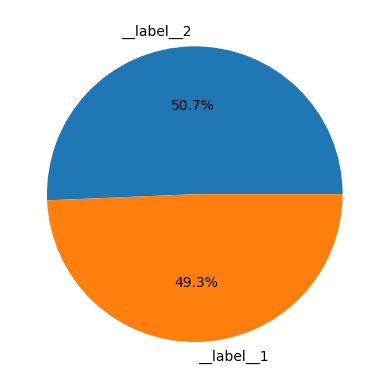

In [7]:
plt.pie(pd.Series(train_rate_list).value_counts(), autopct = '%1.1f%%', labels = pd.Series(train_rate_list).value_counts().keys())
plt.show

In [8]:
i = 0

for string in train_data_list:
    train_data_list[i] = re.sub(r'[^a-z\s]', '', string.lower())
    i += 1

train_data_list

['stuning even for the nongamer this sound track was beautiful it paints the senery in your mind so well i would recomend it even to people who hate vid game music i have played the game chrono cross but out of all of the games i have ever played it has the best music it backs away from crude keyboarding and takes a fresher step with grate guitars and soulful orchestras it would impress anyone who cares to listen ',
 'the best soundtrack ever to anything im reading a lot of reviews saying that this is the best game soundtrack and i figured that id write a review to disagree a bit this in my opinino is yasunori mitsudas ultimate masterpiece the music is timeless and im been listening to it for years now and its beauty simply refuses to fadethe price tag on this is pretty staggering i must say but if you are going to buy any cd for this much money this is the only one that i feel would be worth every penny',
 'amazing this soundtrack is my favorite music of all time hands down the intens

In [9]:
i = 0

for string in train_data_list:
    train_data_list[i] = word_tokenize(string)
    i += 1

train_data_list

[['stuning',
  'even',
  'for',
  'the',
  'nongamer',
  'this',
  'sound',
  'track',
  'was',
  'beautiful',
  'it',
  'paints',
  'the',
  'senery',
  'in',
  'your',
  'mind',
  'so',
  'well',
  'i',
  'would',
  'recomend',
  'it',
  'even',
  'to',
  'people',
  'who',
  'hate',
  'vid',
  'game',
  'music',
  'i',
  'have',
  'played',
  'the',
  'game',
  'chrono',
  'cross',
  'but',
  'out',
  'of',
  'all',
  'of',
  'the',
  'games',
  'i',
  'have',
  'ever',
  'played',
  'it',
  'has',
  'the',
  'best',
  'music',
  'it',
  'backs',
  'away',
  'from',
  'crude',
  'keyboarding',
  'and',
  'takes',
  'a',
  'fresher',
  'step',
  'with',
  'grate',
  'guitars',
  'and',
  'soulful',
  'orchestras',
  'it',
  'would',
  'impress',
  'anyone',
  'who',
  'cares',
  'to',
  'listen'],
 ['the',
  'best',
  'soundtrack',
  'ever',
  'to',
  'anything',
  'im',
  'reading',
  'a',
  'lot',
  'of',
  'reviews',
  'saying',
  'that',
  'this',
  'is',
  'the',
  'best',
  'ga

In [10]:
stop_words = set(stopwords.words('english'))

i = 0
for string in train_data_list:
    L = []
    for word in string:
        if word not in stop_words:
            L.append(word)
    train_data_list[i] = L
    i += 1

train_data_list

[['stuning',
  'even',
  'nongamer',
  'sound',
  'track',
  'beautiful',
  'paints',
  'senery',
  'mind',
  'well',
  'would',
  'recomend',
  'even',
  'people',
  'hate',
  'vid',
  'game',
  'music',
  'played',
  'game',
  'chrono',
  'cross',
  'games',
  'ever',
  'played',
  'best',
  'music',
  'backs',
  'away',
  'crude',
  'keyboarding',
  'takes',
  'fresher',
  'step',
  'grate',
  'guitars',
  'soulful',
  'orchestras',
  'would',
  'impress',
  'anyone',
  'cares',
  'listen'],
 ['best',
  'soundtrack',
  'ever',
  'anything',
  'im',
  'reading',
  'lot',
  'reviews',
  'saying',
  'best',
  'game',
  'soundtrack',
  'figured',
  'id',
  'write',
  'review',
  'disagree',
  'bit',
  'opinino',
  'yasunori',
  'mitsudas',
  'ultimate',
  'masterpiece',
  'music',
  'timeless',
  'im',
  'listening',
  'years',
  'beauty',
  'simply',
  'refuses',
  'fadethe',
  'price',
  'tag',
  'pretty',
  'staggering',
  'must',
  'say',
  'going',
  'buy',
  'cd',
  'much',
  'mon

In [11]:
stemmer = PorterStemmer()

i, j = 0, 0

for string in train_data_list:
    L = []
    for word in string:
        L.append(stemmer.stem(word))
    train_data_list[i] = L
    i += 1



train_data_list

KeyboardInterrupt: 

In [13]:
train_data_list

[['stune',
  'even',
  'nongam',
  'sound',
  'track',
  'beauti',
  'paint',
  'seneri',
  'mind',
  'well',
  'would',
  'recomend',
  'even',
  'peopl',
  'hate',
  'vid',
  'game',
  'music',
  'play',
  'game',
  'chrono',
  'cross',
  'game',
  'ever',
  'play',
  'best',
  'music',
  'back',
  'away',
  'crude',
  'keyboard',
  'take',
  'fresher',
  'step',
  'grate',
  'guitar',
  'soul',
  'orchestra',
  'would',
  'impress',
  'anyon',
  'care',
  'listen'],
 ['best',
  'soundtrack',
  'ever',
  'anyth',
  'im',
  'read',
  'lot',
  'review',
  'say',
  'best',
  'game',
  'soundtrack',
  'figur',
  'id',
  'write',
  'review',
  'disagre',
  'bit',
  'opinino',
  'yasunori',
  'mitsuda',
  'ultim',
  'masterpiec',
  'music',
  'timeless',
  'im',
  'listen',
  'year',
  'beauti',
  'simpli',
  'refus',
  'fadeth',
  'price',
  'tag',
  'pretti',
  'stagger',
  'must',
  'say',
  'go',
  'buy',
  'cd',
  'much',
  'money',
  'one',
  'feel',
  'would',
  'worth',
  'everi',


In [14]:
clean_train_list = []

for string in train_data_list:
    if len(string) > 0:
        clean_train_list.append(string)

    elif len(string) == 0:
        clean_train_list.append('na')


In [16]:
from sklearn.feature_extraction.text import CountVectorizer
import pickle

def custom_analyzer(x):
    return x

vectorizer = CountVectorizer(analyzer = custom_analyzer, max_features = 10000, min_df = 0.01, max_df = 0.99)

vector_train_list = vectorizer.fit_transform(clean_train_list).toarray()

with open('count_vectorizer.pkl', 'wb') as f:
    pickle.dump(vectorizer, f)


print(vector_train_list)


[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 1 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [17]:
vectorizer.vocabulary_

{'even': 173,
 'sound': 510,
 'track': 567,
 'beauti': 53,
 'mind': 350,
 'well': 600,
 'would': 618,
 'peopl': 399,
 'hate': 251,
 'game': 224,
 'music': 363,
 'play': 410,
 'ever': 174,
 'best': 57,
 'back': 46,
 'away': 43,
 'take': 537,
 'guitar': 243,
 'impress': 282,
 'anyon': 27,
 'care': 80,
 'listen': 324,
 'anyth': 28,
 'im': 279,
 'read': 444,
 'lot': 331,
 'review': 463,
 'say': 472,
 'figur': 204,
 'id': 276,
 'write': 620,
 'bit': 60,
 'year': 625,
 'simpli': 494,
 'price': 426,
 'pretti': 424,
 'must': 364,
 'go': 233,
 'buy': 74,
 'cd': 84,
 'much': 362,
 'money': 356,
 'one': 385,
 'feel': 201,
 'worth': 617,
 'everi': 175,
 'amaz': 21,
 'favorit': 199,
 'time': 557,
 'hand': 246,
 'sad': 468,
 'mean': 346,
 'hope': 266,
 'girl': 229,
 'star': 515,
 'import': 281,
 'inspir': 288,
 'person': 403,
 'throughout': 556,
 'like': 321,
 'absolut': 1,
 'probabl': 428,
 'work': 613,
 'havent': 252,
 'heard': 256,
 'cant': 78,
 'sure': 534,
 'never': 369,
 'wish': 605,
 'could':

In [18]:
max_train_length = max(len(data) for data in vector_train_list)

print(max_train_length)

630


In [19]:
max_len = max_train_length

for vector in vector_train_list:
    while len(vector) < max_len:
        vector.append(0)


In [20]:
vectorizer.get_feature_names_out()

array(['abl', 'absolut', 'act', 'action', 'actor', 'actual', 'ad', 'add',
       'addit', 'adventur', 'age', 'ago', 'agre', 'album', 'allow',
       'almost', 'along', 'alreadi', 'also', 'although', 'alway', 'amaz',
       'amazon', 'american', 'anim', 'annoy', 'anoth', 'anyon', 'anyth',
       'anyway', 'appear', 'appreci', 'around', 'arriv', 'art', 'artist',
       'ask', 'attempt', 'attent', 'author', 'avail', 'avoid', 'aw',
       'away', 'awesom', 'babi', 'back', 'bad', 'band', 'base', 'basic',
       'batteri', 'beat', 'beauti', 'becom', 'begin', 'believ', 'best',
       'better', 'big', 'bit', 'black', 'blue', 'book', 'bore', 'bother',
       'bought', 'box', 'boy', 'brand', 'break', 'bring', 'broke', 'busi',
       'buy', 'call', 'came', 'camera', 'cant', 'car', 'care', 'case',
       'cast', 'caus', 'cd', 'certainli', 'chang', 'chapter', 'charact',
       'cheap', 'check', 'child', 'children', 'choic', 'christma',
       'class', 'classic', 'clean', 'clear', 'close', 'collect'

In [21]:
combined_train_list = []

combined_train_list = [[rate] + list(map(str, data)) for rate, data in zip(train_rate_list, vector_train_list)]

combined_train_list

[['__label__2',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '1',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '1',
  '0',
  '0',
  '1',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '1',
  '0',
  '0',
  '0',
  '1',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '1',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0

In [22]:
import gc

del train_data_list, clean_train_list, combined_train_list

gc.collect()


0

In [23]:
column_list = ['rate']

In [24]:
trainDF = make_df(combined_train_list, ['rate'] + list(vectorizer.get_feature_names_out()))

trainDF

,rate,abl,absolut,act,action,actor,actual,ad,add,addit,...,write,writer,written,wrong,ye,year,yet,youll,young,your
0,__label__2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,__label__2,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
2,__label__2,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,__label__2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,__label__2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349995,__label__2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
349996,__label__2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,2,0,0,1,1
349997,__label__2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
349998,__label__2,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [25]:
del 

gc.collect()

0

In [26]:
trainDF['rate'] = trainDF['rate'].replace('__label__2', 1)
trainDF['rate'] = trainDF['rate'].replace('__label__1', 0)

trainDF

,rate,abl,absolut,act,action,actor,actual,ad,add,addit,...,write,writer,written,wrong,ye,year,yet,youll,young,your
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
2,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349995,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
349996,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,2,0,0,1,1
349997,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
349998,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [27]:
torch.manual_seed(1)

In [28]:
class BCFModel(nn.Module):

    def __init__(self, in_in, in_out, out_out, h_ins = [], h_outs = [], dropout_prob = 0.5):
        super().__init__()

        self.in_layer = nn.Linear(in_in, h_ins[0] if len(h_ins) else in_out)
        self.dropout = nn.Dropout(p = dropout_prob)
        
        self.h_layers = nn.ModuleList()
        for idx in range(len(h_ins) - 1):
            self.h_layers.append(nn.Linear(h_ins[idx], h_outs[idx + 1]))
            self.h_layers.append(nn.Dropout(p = dropout_prob))

        self.out_layer = nn.Linear(h_outs[-1] if len(h_outs) else in_out, out_out)

    def forward(self, input_data):

        y = F.relu(self.in_layer(input_data))
        y = self.dropout(y)
        for linear in self.h_layers:
            y = F.relu(linear(y))
            y = self.dropout(y)
        return F.sigmoid(self.out_layer(y))


In [46]:
h_inouts = range(400, 99, -100)
model = BCFModel(in_in = 630, in_out = 50, out_out = 1, h_ins = h_inouts, h_outs = h_inouts)
print(model)

BCFModel(
  (in_layer): Linear(in_features=630, out_features=400, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (h_layers): ModuleList(
    (0): Linear(in_features=400, out_features=300, bias=True)
    (1): Dropout(p=0.5, inplace=False)
    (2): Linear(in_features=300, out_features=200, bias=True)
    (3): Dropout(p=0.5, inplace=False)
    (4): Linear(in_features=200, out_features=100, bias=True)
    (5): Dropout(p=0.5, inplace=False)
  )
  (out_layer): Linear(in_features=100, out_features=1, bias=True)
)


In [30]:
summary(model, input_size = (300000, 628))

Layer (type:depth-idx)                   Output Shape              Param #
BCFModel                                 [300000, 1]               --
├─Linear: 1-1                            [300000, 400]             251,600
├─Dropout: 1-2                           [300000, 400]             --
├─ModuleList: 1-13                       --                        (recursive)
│    └─Linear: 2-1                       [300000, 300]             120,300
├─Dropout: 1-4                           [300000, 300]             --
├─ModuleList: 1-13                       --                        (recursive)
│    └─Dropout: 2-2                      [300000, 300]             --
├─Dropout: 1-6                           [300000, 300]             --
├─ModuleList: 1-13                       --                        (recursive)
│    └─Linear: 2-3                       [300000, 200]             60,200
├─Dropout: 1-8                           [300000, 200]             --
├─ModuleList: 1-13                       -- 

In [31]:
class SentiDataset(Dataset):

    def __init__(self, featureDF, targetDF):
        self.featureDF = featureDF
        self.targetDF = targetDF
        self.n_rows = featureDF.shape[0]
        self.n_featuers = featureDF.shape[1]

    def __len__(self):
        return self.n_rows
    
    def __getitem__(self, index):
        featureTS = torch.FloatTensor(self.featureDF.iloc[index].values)
        targetTS = torch.FloatTensor(self.targetDF.iloc[index].values)

        return featureTS, targetTS

In [32]:
EPOCH = 10
BATCH_SIZE = 64
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
LR = 0.001

In [33]:
train_featureDF = trainDF.iloc[:, 1:]
train_targetDF = trainDF.iloc[:, [0]]

X_train, X_test, y_train, y_test = train_test_split(train_featureDF,
                                                   train_targetDF,
                                                    random_state = 1)

X_train, X_val, y_train, y_val = train_test_split(X_train, 
                                                  y_train,
                                                  random_state = 1)


print(f"{X_train.shape} {X_test.shape} {X_val.shape}")
print(f"{y_train.shape} {y_test.shape} {y_val.shape}")


(196875, 630) (87500, 630) (65625, 630)
(196875, 1) (87500, 1) (65625, 1)


In [34]:
X_train = X_train.astype('int')
X_val = X_val.astype('int')
X_test = X_test.astype('int')

y_train = y_train.astype('int')
y_val = y_val.astype('int')
y_test = y_test.astype('int')

In [35]:
X_test

,abl,absolut,act,action,actor,actual,ad,add,addit,adventur,...,write,writer,written,wrong,ye,year,yet,youll,young,your
337011,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
225075,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
160611,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
233863,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
196905,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48017,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
17828,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
164277,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
132949,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [36]:
trainDS = SentiDataset(X_train, y_train)
valDS = SentiDataset(X_val, y_val)
testDS = SentiDataset(X_test, y_test)

trainDL = DataLoader(trainDS, batch_size = BATCH_SIZE)

In [48]:
optimizer = optim.Adam(model.parameters(), lr = LR)

regLoss = nn.BCELoss()

In [49]:
schduler = lr_scheduler.ReduceLROnPlateau(optimizer,mode = 'max', patience=100,verbose=True)                                                                                                                                     

c:\Users\KDP-2\anaconda3\envs\TORCH_38\lib\site-packages\torch\optim\lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [72]:
def testing(featureDF, targetDF):
    testTS = torch.FloatTensor(featureDF.values).to(DEVICE)
    targetTS = torch.FloatTensor(targetDF.values).to(DEVICE)
    
    with torch.no_grad():
        pre_val = model(testTS)
        loss_val = regLoss(pre_val, targetTS)
        score_val = BinaryF1Score()(pre_val, targetTS)
        pred_labels = (pre_val >= 0.5).float()


    
    return loss_val, score_val, pred_labels

In [44]:

# 저장 경로 및 파일명 지정
SAVE_PATH = './saved_models/'  # 모델을 저장할 디렉토리
os.makedirs(SAVE_PATH, exist_ok=True)  # 디렉토리가 없는 경우 생성


def training(valTS, valtargetTS):
    
    BREAK_CNT_LOSS = 0
    BREAK_CNT_SCORE = 0
    LIMIT_VALUE = 10

    LOSS_HISTORY, SCORE_HISTORY = [[], []], [[], []]

    for epoch in range(EPOCH):
        SAVE_MODEL = os.path.join(SAVE_PATH, f'model_{epoch}.pth')  # 모델 전체 저장
        SAVE_FILE = os.path.join(SAVE_PATH, f'model_weights_{epoch}.pth')  # 가중치 저장

        # 배치 크기만큼 데이터 로딩해서 학습 진행
        loss_total, score_total = 0, 0


        for featureTS, targetTS in trainDL:

            # 학습 진행
            pre_y = model(featureTS)

            # 손실 계산
            loss = regLoss(pre_y, targetTS)
            loss_total += loss.item()

            # 성능평가 계산
            score = BinaryF1Score()(pre_y, targetTS)

            score_total += score.item()
            

            # 최적화 진행
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        
        val_loss, val_f1 = testing(valTS, valtargetTS)
        LOSS_HISTORY[1].append(val_loss)
        SCORE_HISTORY[1].append(val_f1)

        LOSS_HISTORY[0].append(loss_total / len(trainDL))
        SCORE_HISTORY[0].append(score_total / len(trainDL))

        print(f"[{epoch + 1}/{EPOCH}]\n - TRAIN LOSS : {LOSS_HISTORY[0][-1]} F1 : {SCORE_HISTORY[0][-1]}")
        print(f"- VAL LOSS : {LOSS_HISTORY[1][-1]} F1 : {SCORE_HISTORY[1][-1]}")

        schduler.step(val_f1)

            # 학습 진행 모니터링/스케쥴링 - 검증 DS 기준
        # Score 기준
        if len(SCORE_HISTORY[1]) >= 2:
            if SCORE_HISTORY[1][-1] >= SCORE_HISTORY[1][-2]: BREAK_CNT_SCORE += 1

        # 성능이 좋은 학습 가중치 저장

        if len(SCORE_HISTORY[1]) == 1:
            # 첫 번째라서 무조건 모델 파라미터 저장
            torch.save(model.state_dict(), SAVE_FILE)
            # 모델 전체 저장
            torch.save(model, SAVE_MODEL)
        else:
            if SCORE_HISTORY[1][-1] > max(SCORE_HISTORY[1][:-1]):
                torch.save(model.state_dict(), SAVE_FILE)
                torch.save(model, SAVE_MODEL)

        if BREAK_CNT_LOSS > LIMIT_VALUE:
            print(f'성능 및 손실 개선이 없어서 {epoch} EPOCH에 학습 중단')
            break

    return LOSS_HISTORY, SCORE_HISTORY


In [50]:
loss, f1 = training(X_val, y_val)

[1/10]
 - TRAIN LOSS : 0.46990171625972915 F1 : 0.7992963882227939
- VAL LOSS : 0.43854179978370667 F1 : 0.8319283127784729
[2/10]
 - TRAIN LOSS : 0.41311456159430354 F1 : 0.8361142180475043
- VAL LOSS : 0.4304891526699066 F1 : 0.835206925868988
[3/10]
 - TRAIN LOSS : 0.4025126433058687 F1 : 0.8443220283328847
- VAL LOSS : 0.42097553610801697 F1 : 0.837488055229187
[4/10]
 - TRAIN LOSS : 0.3910205232601178 F1 : 0.8493189427966532
- VAL LOSS : 0.42731040716171265 F1 : 0.8390918374061584
[5/10]
 - TRAIN LOSS : 0.38727826602105625 F1 : 0.8539368504241259
- VAL LOSS : 0.43850305676460266 F1 : 0.8385017514228821
[6/10]
 - TRAIN LOSS : 0.37481306979495055 F1 : 0.8585604660535037
- VAL LOSS : 0.437192440032959 F1 : 0.8375222086906433
[7/10]
 - TRAIN LOSS : 0.3694063103408212 F1 : 0.8626233190927639
- VAL LOSS : 0.4537200629711151 F1 : 0.8336535692214966
[8/10]
 - TRAIN LOSS : 0.36310568374881586 F1 : 0.8660682538596306
- VAL LOSS : 0.48483023047447205 F1 : 0.836322009563446
[9/10]
 - TRAIN LO

In [69]:
model = torch.load('./saved_models/model_3.pth')


C:\Users\KDP-2\AppData\Local\Temp\ipykernel_10164\2951511148.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('./saved_models/model_3.pth')


In [71]:
y_test.value_counts()

rate
1       44480
0       43020
Name: count, dtype: int64

In [73]:
model.eval()
test_loss, test_f1, prediction = testing(X_test, y_test)
print(test_loss, test_f1)

tensor(0.3542) tensor(0.8553) 1.0    52276
0.0    35224
Name: count, dtype: int64


In [59]:
y_test

,rate
337011,0
225075,0
160611,0
233863,0
196905,0
...,...
48017,0
17828,0
164277,1
132949,0


In [5]:
print(Image.open(r'C:\Users\KDP-2\OneDrive\바탕 화면\Python\EX_CV\data\Data\ETC\_96974101_gettyimages-cheetah.jpg'))

C:\Users\KDP-2\OneDrive\바탕 화면\Python\EX_CV\data\Data\ETC\_96974101_gettyimages-cheetah.jpg
